# Austral summer sub-seasonal precipitation predictable modes over South America #

## Questions to be addressed: ##
+ How do the analyzed S2S models (and the multi-model ensemble of these models) represent the dominant modes of sub-seasonal precipitation variability during the extended austral summer at different lead times? 
- What modes of sub-seasonal precipitation variability contribute to the potential predictability during the austral summer? 
* What percentage of the actual S2S models prediction ability comes from the identified modes of sub-seasonal precipitation variability? 


In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import mpl_toolkits.basemap as bm
from scipy import stats

/home/marisol/anaconda3/lib/python3.5/importlib/_bootstrap.py:222: RuntimeWarning: numpy.dtype size changed, may indicate binary incompatibility. Expected 96, got 88
  return f(*args, **kwds)


#### Observational data:####

GPCP (daily precipitation)

#### S2S model data:####

Thursday initial conditions
ECMWF (2017 version), ECCC (2017 version), NCEP (fixed), CMA (fixed) 
Extended austral summer: Nov-Mar
Hindcast period: 1999/2000 to 2009/2010 (11 complete summers)
Days 5 to 11: week 1
Days 12 tp18: week 2
Days 19 to 25: week 3
Days 26 to 32: week 4

#### Methodology:####

* EOF analysis applied to weeks 1 to 4 hindcasts: 4 ensemble members of each model (1 control and 3 perturbed to make all models comparable), for each model independently and for the multi-model (mean of anomalies of each model). **Done by Felipe** 
* Analysis of predictable modes based on Lee et al (2011) and M Osman PhD Thesis. Determination of predictable modes based on the correlation of the principal components and spatial loadings from Observed EOF and forecasted EOF.
* Prediction ability (correlation between forecast and observed anomalies): for each model independently and for the multi-model (mean of anomalies of each model)

##### Opening files
- Each principal component (PC) has 242 values. The first 242 values are for PC1, from 243 to 484 for PC2 and so on until PC10 (file contains 2420 lines, that is 242*10 -> pc.dat)

- Eigenvector file (file name = evec.dat). This file has 20910 lines. The first 2091 values are for EOF1, from 2092 to 4183 for EOF2 and so on until EOF10. 2091 is obtained from the product between grid points (x = 41, y = 51)  

- Eigenvalue file (file name = eval.dat). This file has 10 lines. The first line is for EOF1, second line is for EOF2, and so on until 10th line which is for EOF10


In [3]:
#load observed PC
route = '/home/marisol/s2s_predictable_modes_paper/DATA/observation/eof.gpcp.NOVMAR/'
file = 'pc.dat'
nmodes = 10
nweeks = 242
nx = 41
ny = 51
npoints = nx*ny
f = open(route + file, 'r')  
obs_pc = []
for line in f:
    obs_pc.append(line.strip())
f.close()
obs_pc = np.array(obs_pc).astype(np.float)
obs_pc = np.reshape(obs_pc, [nmodes, nweeks])
#load observed loading
file = 'evec.dat'
f = open(route + file, 'r')
obs_evec = []
for line in f:
    obs_evec.append(line.strip())
f.close()
obs_evec = np.array(obs_evec).astype(np.float)
obs_evec = np.reshape(obs_evec, [nmodes, npoints])
#load observed eigenvalues
file = 'eval.dat'
f = open(route + file, 'r')
obs_eval = []
for line in f:
    obs_eval.append(line.strip())
f.close()
obs_eval = np.array(obs_eval).astype(np.float)

In [4]:
#load Forecasted EOF
route = '/home/marisol/s2s_predictable_modes_paper/DATA/hindcast/models/'
#models
models = ['cma', 'eccc', 'ecmwf', 'ncep']
models_pc = []
for i in models:
    file = 'weekly.models.anoconv.'+ i + '.NOVMAR.tp.sfc.cfpf3.w1.SA.eof.paper/pc.dat'
    f = open(route + file, 'r')  
    for line in f:
        models_pc.append(line.strip())
    f.close()
models_pc = np.array(models_pc).astype(np.float)
models_pc = np.reshape(models_pc,[len(models), nmodes, nweeks])
models_evec = []
for i in models:
    file = 'weekly.models.anoconv.'+ i + '.NOVMAR.tp.sfc.cfpf3.w1.SA.eof.paper/evec.dat'
    f = open(route + file, 'r')  
    for line in f:
        models_evec.append(line.strip())
    f.close()
models_evec = np.array(models_evec).astype(np.float)
models_evec = np.reshape(models_evec,[len(models), nmodes, npoints])
models_eval = []
for i in models:
    file = 'weekly.models.anoconv.'+ i + '.NOVMAR.tp.sfc.cfpf3.w1.SA.eof.paper/eval.dat'
    f = open(route + file, 'r')  
    for line in f:
        models_eval.append(line.strip())
    f.close()
models_eval = np.array(models_eval).astype(np.float)
models_eval = np.reshape(models_eval,[len(models), nmodes])

#### Observed and Forecasted Modes

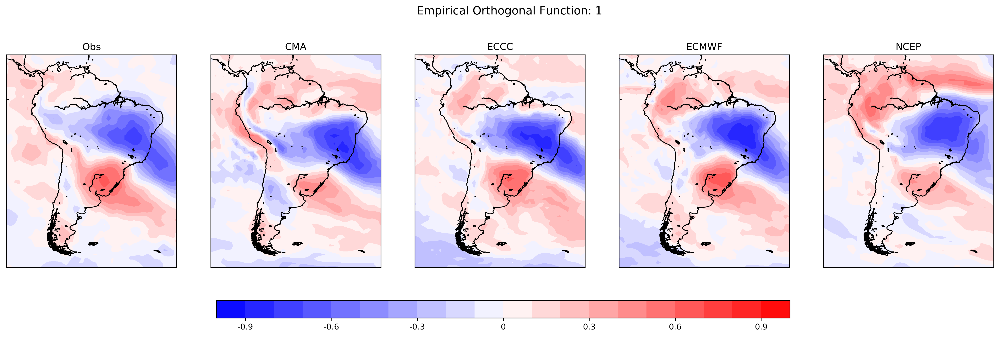

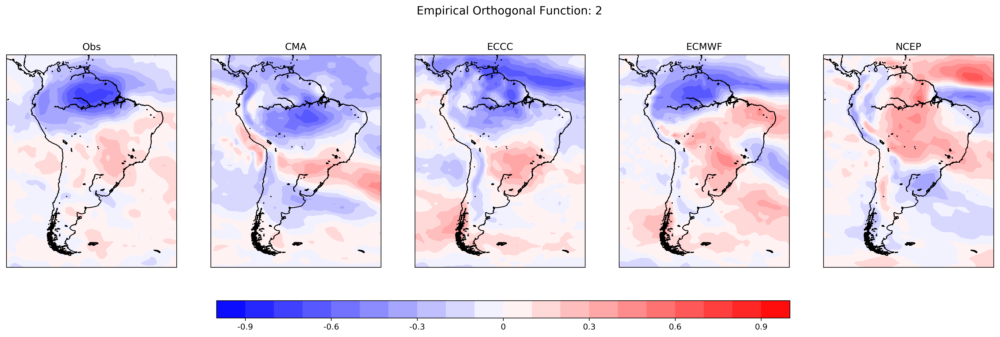

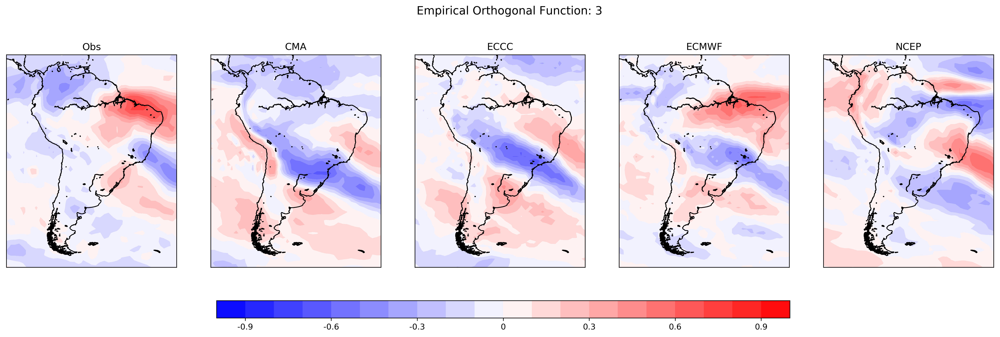

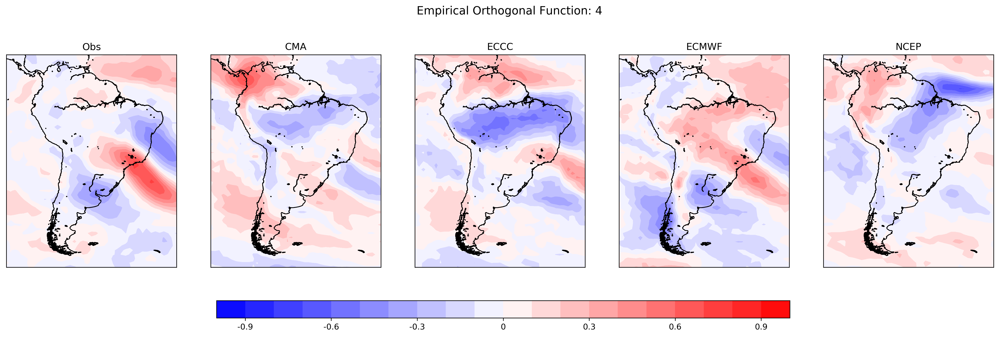

In [5]:
#plot observed and forecasted modes
lon = np.arange(270,270+nx*1.5,1.5) 
lat = np.arange(-60,-60+ny*1.5,1.5) 
[dx,dy] = np.meshgrid(lon,lat)
# set desired contour levels.
clevs = np.linspace(-1,1,21)
barra = plt.cm.bwr #colorbar
for j in np.arange(4): #loop over modes
    fig = plt.figure(figsize = (22,6), dpi = 300)  
    plt.subplot(1,5,1)
    mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                         urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
    mapproj.drawcoastlines()
    lonproj, latproj = mapproj(dx, dy)
    CS1 = mapproj.contourf(lonproj, latproj,np.reshape(obs_evec[j,:],[ny,nx]),clevs,cmap=barra,vmin=-1,vmax=1)
    plt.title("Obs",fontsize=12)
    for i in np.arange(4): #loop over models
        plt.subplot(1,5,i+2)
        mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                             urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
        mapproj.drawcoastlines()
        lonproj, latproj = mapproj(dx, dy)
        CS1 = mapproj.contourf(lonproj, latproj,np.reshape(models_evec[i,j,:],[ny,nx]),clevs,cmap=barra,vmin=-1,vmax=1)
        plt.title(models[i].upper(),fontsize=12)
        #titulo general
        plt.suptitle('Empirical Orthogonal Function: '+ str(j+1),fontsize=14,x=0.52,y=0.95)
    cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
    fig.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
    cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
    plt.savefig('unsorted_eofs_'+str(j+1)+'.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 



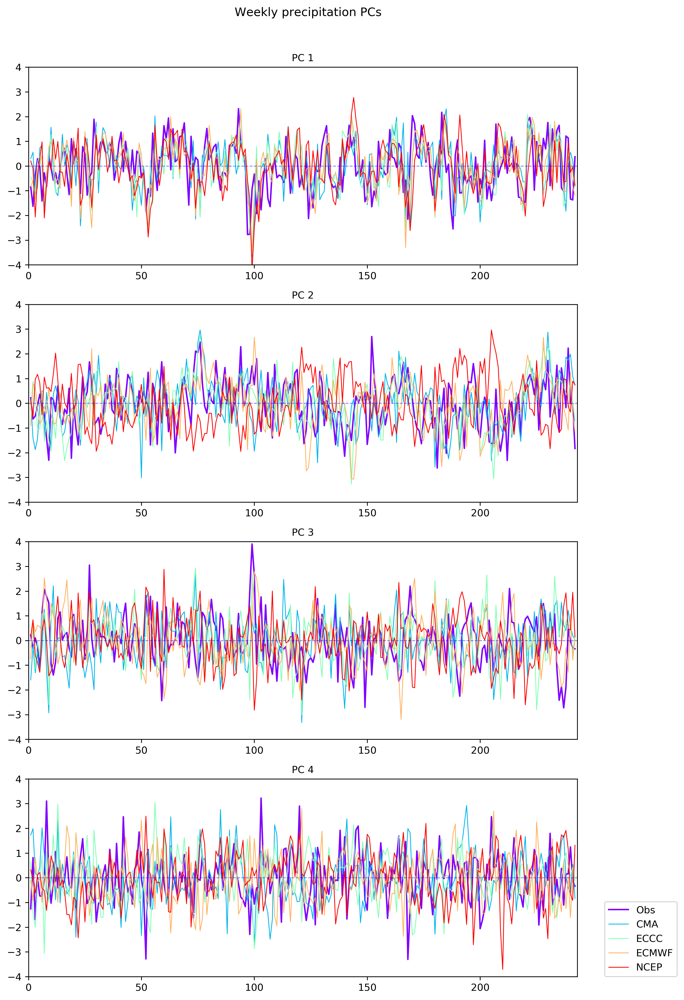

In [6]:
x = np.arange(1,nweeks+1)  
fig1 = plt.figure(figsize = (10,17), dpi = 300)  #fig size in inches
for j in np.arange(4): #loop over Pcs
    color = iter(cm.rainbow(np.linspace(0,1,5)))
    c = next(color)
    ax = plt.subplot(4,1,j+1)
    ax.plot(x,obs_pc[j,:], color = c, linewidth=1.5, label = 'Obs')
    
    for i in np.arange(4): #loop over models
        c = next (color)
        ax.plot(x,models_pc[i,j,:],color = c, label = models[i].upper(),linewidth=0.8)
        
    ax.axhline(y=0,xmin=0,linestyle='--',linewidth=0.8, color='b',alpha=0.5)
    # tidy up the figure
    ax.set_xlim((0,nweeks+1))
    ax.set_ylim((-4,4))
    plt.title('PC '+str(j+1),fontsize=10)

plt.legend(bbox_to_anchor=(1.05, 0), loc='lower left', borderaxespad=0.)
plt.suptitle('Weekly precipitation PCs',fontsize=12,x=0.52,y=0.93)
    
fig1.savefig('unsorted_pcs.jpg',dpi=300,bbox_inches='tight',papertype='A4',orientation='landscape')


## Analysis of Predictable modes ##
Consist in the definition of predictable modes based on the ability of the models in forecasting them. Predictable modes are selected based on:
+ Separation of observed modes in terms of the percentage of variance they explain
+ The level of significance of the Pattern Skill Score, define as:
$$ PSS = \sqrt(TCC x PCC) $$

Where $TCC$ is the correlation between PCs and $PCC$ is the correlation between spatial loadings
In some ocations, forecasted PCs don't match to Observed Pcs and forecasted modes need to be sorted before determining predictable modes

In [7]:
#compute correlation between observed and forecasted PCs
tcc = np.empty([len(models), nmodes, nmodes])
for i in np.arange(len(models)):
    for j in np.arange(nmodes): #loop over observed modes
        for k in np.arange(nmodes): #loop over forecasted modes
            tcc[i, j, k] = np.corrcoef(obs_pc[j,:], models_pc[i,k,:])[0,1]
#compute correlation between observed and forecasted loadings
pcc = np.empty([len(models), nmodes, nmodes])
for i in np.arange(len(models)):
    for j in np.arange(nmodes):
        for k in np.arange(nmodes):
            pcc[i, j, k] = np.corrcoef(obs_evec[j,:], models_evec[i,k,:])[0,1]

#compute pss
pss = np.sqrt(tcc * pcc)
pss[np.isnan(pss)] = 0
models_pc_sorted = np.empty([len(models), 4, nweeks])
models_evec_sorted = np.empty([len(models), 4, npoints])
models_eval_sorted = np.empty([len(models), 4])
#find max pss for each mode
for i in np.arange(len(models)):
    pss_aux = pss [i,:,:]
    for j in np.arange(4):
        index = np.argmax(pss_aux[j,:])
        models_pc_sorted[i,j,:] = models_pc[i,index+j,:]
        models_evec_sorted[i,j,:] = models_evec[i,index+j,:]
        models_eval_sorted[i,j] = models_eval[i,index+j]
        pss_aux = np.delete(pss_aux,index,1)
        


/home/marisol/anaconda3/lib/python3.5/site-packages/ipykernel_launcher.py:15: RuntimeWarning: invalid value encountered in sqrt
  from ipykernel import kernelapp as app


#### Observed and (sorted) Forecasted Modes

/home/marisol/anaconda3/lib/python3.5/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


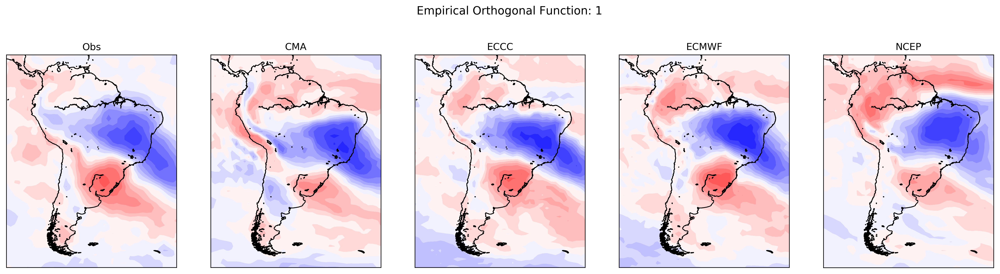

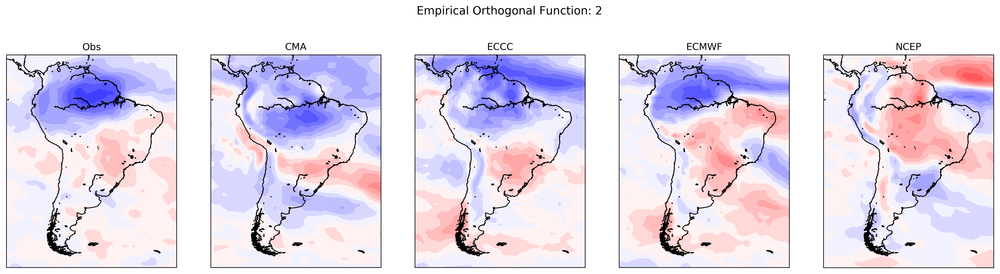

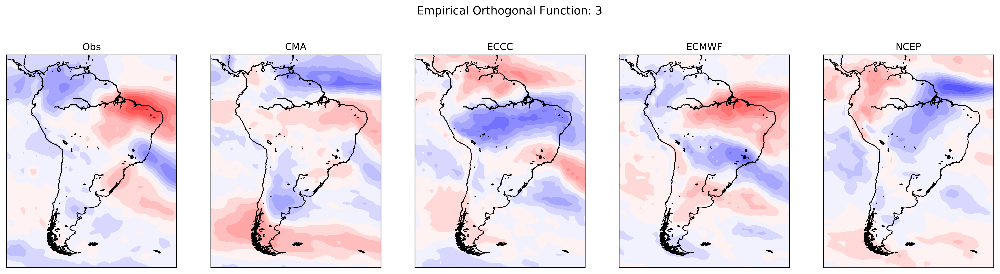

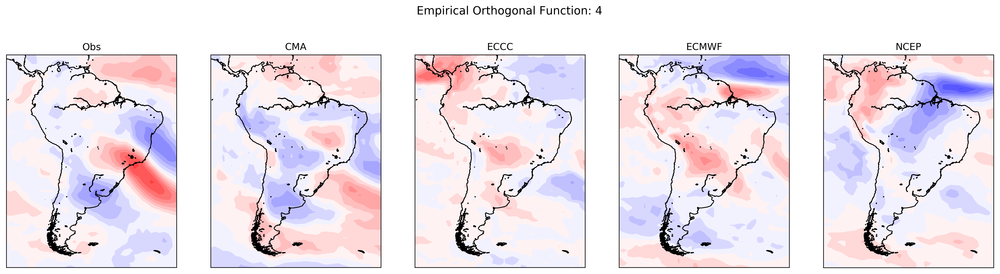

In [8]:
#plot observed and sorted forecasted modes
for j in np.arange(4):
    fig2 = plt.figure(figsize = (22,6),dpi = 300)  #fig size in inches
    plt.subplot(1,5,1)
    mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                         urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
    mapproj.drawcoastlines()
    lonproj, latproj = mapproj(dx, dy)      #poject grid
    
    CS1 = mapproj.contourf(lonproj, latproj,np.reshape(obs_evec[j,:],[ny,nx]),clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
    plt.title("Obs",fontsize=12)
    
    for i in np.arange(4):
        plt.subplot(1,5,i+2)
        mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                             urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
        mapproj.drawcoastlines()
        lonproj, latproj = mapproj(dx, dy)      #poject grid
        # set desired contour levels.
        CS1 = mapproj.contourf(lonproj, latproj,np.reshape(models_evec_sorted[i,j,:],[ny,nx]),clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
        plt.title(models[i].upper(),fontsize=12)
        #titulo general
    plt.suptitle('Empirical Orthogonal Function: '+ str(j+1),fontsize=14,x=0.52,y=0.95)
    cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
    fig2.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
    cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
    plt.savefig('sorted_eofs_'+str(j+1)+'.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 



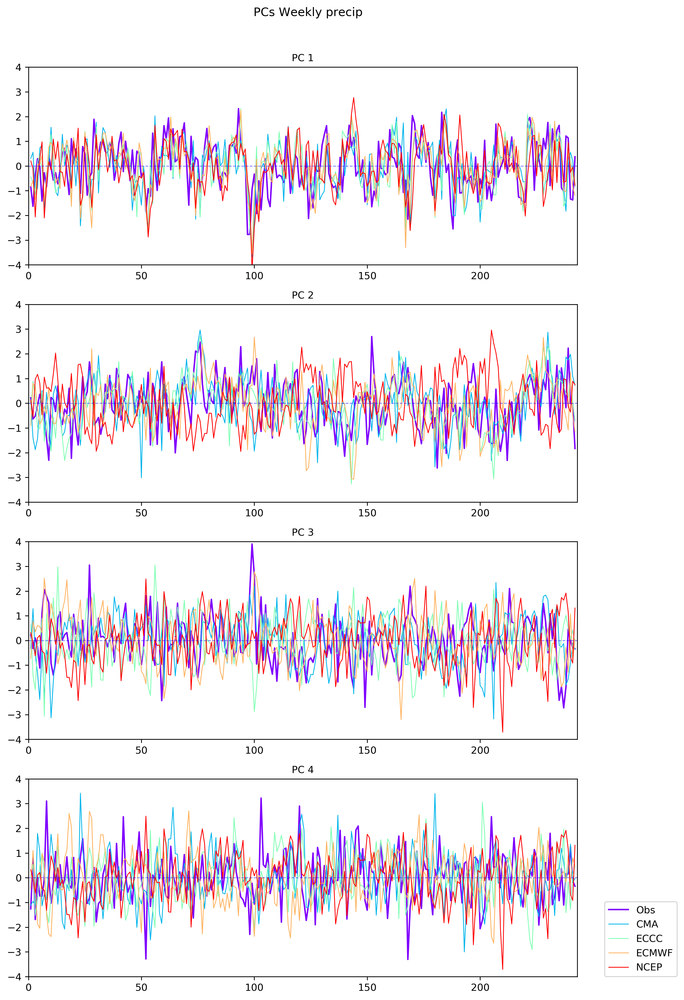

In [9]:
fig3 = plt.figure(figsize = (10,17),dpi = 300)  #fig size in inches
for i in np.arange(4):
    color = iter(cm.rainbow(np.linspace(0,1,5)))
    c = next(color)
    ax = plt.subplot(4,1,i+1)
    ax.plot(x,obs_pc[i,:], color = c, linewidth=1.5, label = 'Obs')
    
    for j in np.arange(4):
        c = next (color)
        ax.plot(x,models_pc_sorted[j,i,:],color = c, label = models[j].upper(),linewidth=0.8)
        
    ax.axhline(y=0,xmin=0,linestyle='--',linewidth=0.8, color='b',alpha=0.5)
    # tidy up the figure
    ax.set_xlim((0,nweeks+1))
    ax.set_ylim((-4,4))
    plt.title('PC '+str(i+1),fontsize=10)
plt.legend(bbox_to_anchor=(1.05, 0), loc='lower left', borderaxespad=0.)
plt.suptitle('PCs Weekly precip',fontsize=12,x=0.52,y=0.93)
    
fig3.savefig('sorted_pcs.jpg',dpi=300,bbox_inches='tight',papertype='A4',orientation='landscape')


Since Felipe already determined that the first 4 observed modes are well separated from the rest of the modes, we only need to assess the significan of the $PSS$. 

In [10]:
#assessing signifcance of modes
#r*sqrt(n-2/(1-r2))
significance_pc = np.empty([len(models), 4])
significance_evec = np.empty([len(models), 4])
for j in np.arange(len(models)):
    for i in np.arange(4):
        r = np.corrcoef(obs_pc[i,:], models_pc_sorted[j,i,:])[0,1]
        significance_pc[j,i] = stats.t.ppf(1-0.05,nweeks-2)<= np.abs( r * np.sqrt((nweeks-2)/(1-np.power(r,2))))
        r = np.corrcoef(obs_evec[i,:], models_evec_sorted[j,i,:])[0,1]
        significance_evec[j,i] = stats.t.ppf(1-0.05,npoints-2)<= np.abs(r * np.sqrt((npoints-2)/(1-np.power(r,2))))


## Predictable modes according to the t-test

* EMC, CMA, NCEP: 3 predictable mode
* ECMWF: 4 predictable modes

In [11]:
#open full observed and forecasted anomalies and compute correlations
#open observations
path='/home/marisol/s2s_predictable_modes_paper/datos_S2S_Felipe/observation.gpcp/out/'
file='weekly.anoconv.out.NOVMAR.w1.SA.bin'
obs_weekly_precip = np.fromfile(path+file,dtype='f4',count=-1)
obs_weekly_precip = np.reshape(obs_weekly_precip,[nweeks, ny*nx])
predic_modes = [3, 3, 4, 3]
#compute correlations between: full observed anomalies and

#forecasted anomalies
models = ['cma', 'eccc', 'ecmwf', 'ncep']
path='/home/marisol/s2s_predictable_modes_paper/hindcast.s2s/out/'
forecasted_weekly_precip = np.empty([len(models), nweeks*ny*nx])
for i in range(len(models)):
    file = path + 'weekly.'+ models[i] +'.tp.sfc/weekly.models.anoconv.' + models[i] + '.NOVMAR.tp.sfc.cfpf3.w1.SA.bin'
    forecasted_weekly_precip[i,:] = np.fromfile(file,dtype='f4',count=-1)

forecasted_weekly_precip = np.reshape(forecasted_weekly_precip,[len(models), nweeks, ny*nx])

R_forec_anomalies = np.empty([len(models),ny*nx])
for i in np.arange(len(models)):
    for j in np.arange(ny*nx):
        R_forec_anomalies[i,j] =np.corrcoef(forecasted_weekly_precip[i,:,j],obs_weekly_precip[:,j])[0,1]

R_forec_anomalies = np.reshape(R_forec_anomalies,[len(models), ny, nx])    

#forecasted predictable modes
R_forec_predic_modes = np.empty([len(models),ny*nx])
for i in np.arange(len(models)):
    aux = np.matmul(np.transpose(models_pc_sorted[i,0:predic_modes[i],:]),models_evec_sorted[i,0:predic_modes[i],:])
    for j in np.arange(R_forec_predic_modes.shape[1]):
        R_forec_predic_modes[i,j] =np.corrcoef(aux[:,j],obs_weekly_precip[:,j])[0,1]

R_forec_predic_modes = np.reshape(R_forec_predic_modes,[len(models), ny, nx])    

#observed predictable modes
R_obs_predic_modes0 = np.empty([ny*nx])
R_obs_predic_modes1 = np.empty([ny*nx])
aux0 = np.matmul(np.transpose(obs_pc[0:4,:]),obs_evec[0:4,:])
aux1 = np.matmul(np.transpose(obs_pc[0:3,:]),obs_evec[0:3,:])
for j in np.arange(nx*ny):
    R_obs_predic_modes0[j] =np.corrcoef(aux0[:,j],obs_weekly_precip[:,j])[0,1]
    R_obs_predic_modes1[j] =np.corrcoef(aux1[:,j],obs_weekly_precip[:,j])[0,1]

R_obs_predic_modes0 = np.reshape(R_obs_predic_modes0,[ny, nx])
R_obs_predic_modes1 = np.reshape(R_obs_predic_modes1,[ny, nx])

#residual forecasted modes
forec_predic_anomalies = np.empty([len(models), nweeks, ny*nx])
for i in np.arange(len(models)):
    forec_predic_anomalies[i,:,:] = np.matmul(np.transpose(models_pc_sorted[i,0:predic_modes[i],:]),models_evec_sorted[i,0:predic_modes[i],:])


#standardized forecasted weekly precipitation to compute the residual forecasted modes
forecasted_weekly_precip_sd = np.empty([len(models),nweeks, npoints])
CV_m = np.logical_not(np.identity(nweeks))
for i in np.arange(nweeks):
    forecasted_weekly_precip_sd[:,i,:] = forecasted_weekly_precip[:,i,:]/np.nanstd(forecasted_weekly_precip[:,CV_m[i,:],:], axis=1)

residual_forec_modes = forecasted_weekly_precip_sd - forec_predic_anomalies

R_forec_residual_modes = np.empty([len(models),ny*nx])

for i in np.arange(len(models)):
    for j in np.arange(ny*nx):
        R_forec_residual_modes[i,j] =np.corrcoef(residual_forec_modes[i,:,j],obs_weekly_precip[:,j])[0,1]

R_forec_residual_modes = np.reshape(R_forec_residual_modes,[len(models), ny, nx])    

In [12]:
## Plotting results

### Potential predictability

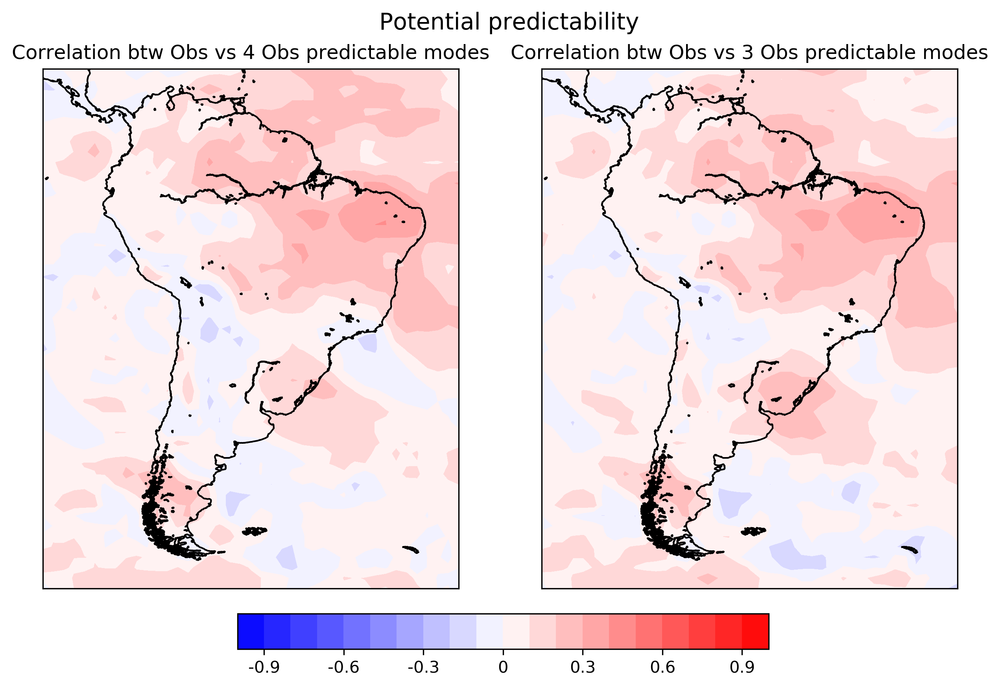

In [13]:
fig = plt.figure(figsize = (10,6),dpi=300)
plt.subplot(1,2,1)
mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                        urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
mapproj.drawcoastlines()
lonproj, latproj = mapproj(dx, dy)      #poject grid
clevs = np.linspace(-1,1,21)          
barra = plt.cm.bwr #colorbar
CS1 = mapproj.contourf(lonproj, latproj,R_obs_predic_modes0,clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
plt.title('Correlation btw Obs vs 4 Obs predictable modes')
plt.subplot(1,2,2) 
mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                        urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
mapproj.drawcoastlines()
lonproj, latproj = mapproj(dx, dy)      #poject grid
clevs = np.linspace(-1,1,21)          
barra = plt.cm.bwr #colorbar
CS1 = mapproj.contourf(lonproj, latproj,R_obs_predic_modes1,clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
plt.title('Correlation btw Obs vs 3 Obs predictable modes')
plt.suptitle('Potential predictability',fontsize=14,x=0.52,y=0.95)
cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
fig.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
plt.savefig('r_obs_predic_modes.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 


### Correlation btw Observation and Models

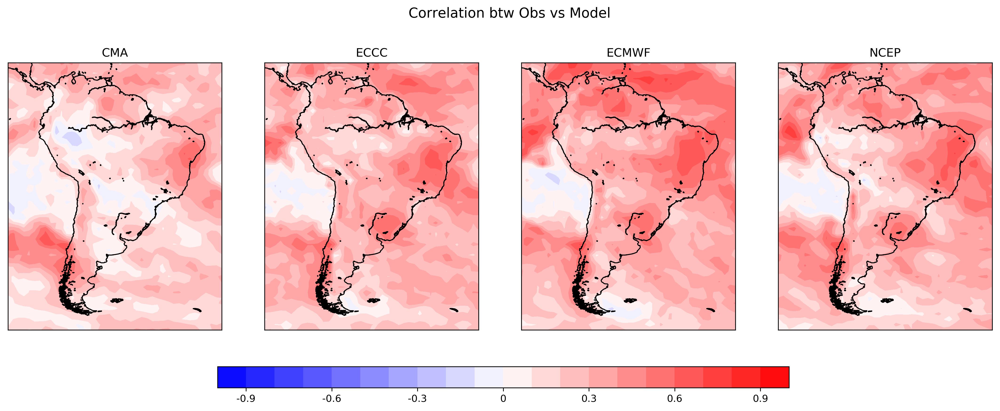

In [14]:
fig = plt.figure(figsize = (18,6),dpi=300)  #fig size in inches
for i in np.arange(4):
    plt.subplot(1,4,i+1)
    mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                        urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
    mapproj.drawcoastlines()
    lonproj, latproj = mapproj(dx, dy)      #poject grid
    # set desired contour levels.
    clevs = np.linspace(-1,1,21)          
    barra = plt.cm.bwr #colorbar
    CS1 = mapproj.contourf(lonproj, latproj,R_forec_anomalies[i,:,:],clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
    plt.title(models[i].upper(),fontsize=12)
#titulo general
plt.suptitle('Correlation btw Obs vs Model',fontsize=14,x=0.52,y=0.95)
#fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
fig.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
plt.savefig('r_forec_anomalies.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 


### Correlation btwn Observation and Forecasted predictable modes

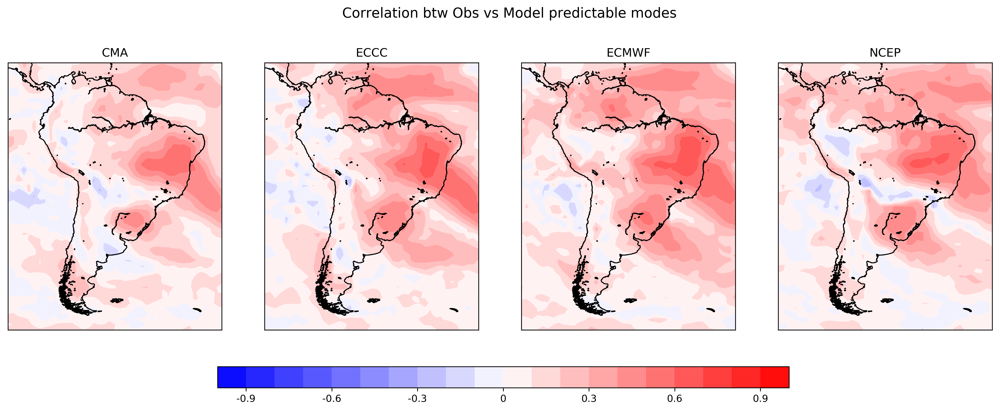

In [15]:
fig = plt.figure(figsize = (18,6),dpi=300)  #fig size in inches
for i in np.arange(4):
    plt.subplot(1,4,i+1)
    mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                        urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')

    mapproj.drawcoastlines()
    lonproj, latproj = mapproj(dx, dy)      #poject grid
    # set desired contour levels.
    clevs = np.linspace(-1,1,21)          
    barra = plt.cm.bwr #colorbar
    CS1 = mapproj.contourf(lonproj, latproj,R_forec_predic_modes[i,:,:],clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
    plt.title(models[i].upper(),fontsize=12)
#titulo general
plt.suptitle('Correlation btw Obs vs Model predictable modes',fontsize=14,x=0.52,y=0.95)
#fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
fig.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
plt.savefig('r_forec_predic_modes.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 


### Correlation btwn Observation and Forecasted residual modes

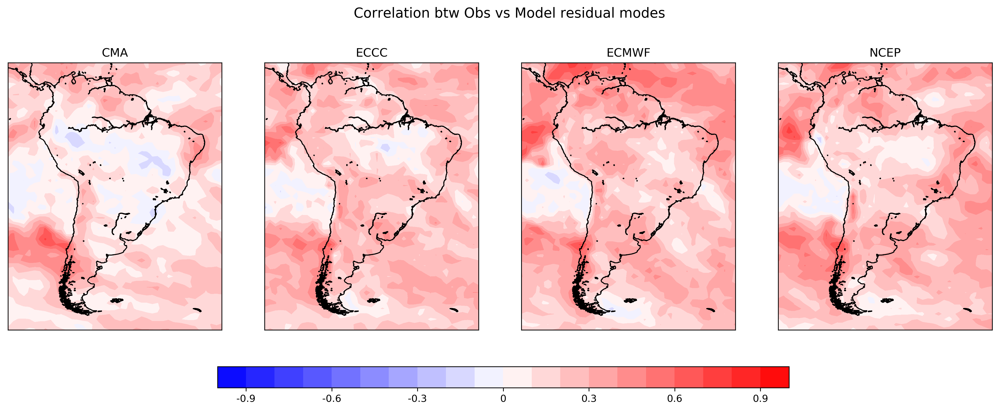

In [16]:
fig = plt.figure(figsize = (18,6),dpi=300)  #fig size in inches
for i in np.arange(4):
    plt.subplot(1,4,i+1)
    mapproj = bm.Basemap(projection='cyl',llcrnrlon = 270, llcrnrlat = -60, 
                        urcrnrlon = 270+(nx-1)*1.5, urcrnrlat = -60+(ny-1)*1.5, resolution = 'i')
    mapproj.drawcoastlines()
    lonproj, latproj = mapproj(dx, dy)      #poject grid
    # set desired contour levels.
    clevs = np.linspace(-1,1,21)          
    barra = plt.cm.bwr #colorbar
    CS1 = mapproj.contourf(lonproj, latproj,R_forec_residual_modes[i,:,:],clevs,cmap=barra,vmin=-1,vmax=1) #extended generate pretty colorbar
    plt.title(models[i].upper(),fontsize=12)
#titulo general
plt.suptitle('Correlation btw Obs vs Model residual modes',fontsize=14,x=0.52,y=0.95)
#fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.29, 0.05, 0.45, 0.05])
fig.colorbar(CS1, cax=cbar_ax,orientation='horizontal')
cbar_ax.set_xticklabels([-0.9,-0.6,-0.3,0,0.3,0.6,0.9])#,size = 9)
plt.savefig('r_forec_residual_modes.jpg',dpi=300,bbox_inches='tight',orientation='landscape',papertype='A4') 


## Conclusions
* EMC, CMA, NCEP: 3 predictable mode
* ECMWF: 4 predictable modes

- Most of the skill in northern SA and the SA IS dipole parttern is well captured by the predictable modes
- The residual modes accounts for the correlation in extratropical region, especially in the southern Andes and southern SA (Argentina and Uruguay)
- The potential preditability (Correlation btwn Obs and observed predictable modes) is lower than actual skill ---> signal to noise paradox